# Latar Belakang
Sebuah perusahaan yang bergerak di IT, ingin merekrut data scientist. Perusahaan ini melakukan kegiatan bisnis dengan menjual lisensi software kepada kliennya. Perusahaan ini hendak melakukan penyusunan strategi penjualan untuk memaksimalkan profit dengan berdasarkan data penjualan yang telah dikumpulkan.

## Pernyataan Masalah
Perusahaan ingin mengetahui **behavior customer serta trend penjualan melalui analisa data penjualan selama 3 tahun terakhir**. Informasi ini akan membantu perusahaan untuk memaksimalkan profitnya dengan menjual produk yang tepat, meningkatkan market share dan mengurangi resiko kerugian yang diakibatkan penjualan dengan cara yang tidak menguntungkan.

Sebagai seorang *data analyst*, kita akan mencoba menjawab pertanyaan berikut:

* **Bagaimana tren penjualan lisensi Software As a Service?**
* **Apa saja hal - hal yang perlu dilakukan untuk memaksimalkan jumlah penjualan dan profit ?**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

df1 = pd.read_csv("C:/Capstone/SaaS-Sales.csv")

In [42]:
display(df1.head(5),df1.tail(5))

,Row ID,Order ID,Order Date,Date Key,Contact Name,Country,City,Region,Subregion,Customer,Customer ID,Industry,Segment,Product,License,Sales,Quantity,Discount,Profit
0,1,EMEA-2022-152156,11/9/2022,20221109,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,1017,Energy,SMB,Marketing Suite,16GRM07R1K,261.9600,2,0.00,41.9136
1,2,EMEA-2022-152156,11/9/2022,20221109,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,1017,Energy,SMB,FinanceHub,QLIW57KZUV,731.9400,3,0.00,219.5820
2,3,AMER-2022-138688,6/13/2022,20220613,Deirdre Bailey,United States,New York City,AMER,NAMER,Phillips 66,1056,Energy,Strategic,FinanceHub,JI6BVL70HQ,14.6200,2,0.00,6.8714
3,4,EMEA-2021-108966,10/11/2021,20211011,Zoe Hodges,Germany,Stuttgart,EMEA,EU-WEST,Royal Dutch Shell,1031,Energy,SMB,ContactMatcher,DE9GJKGD44,957.5775,5,0.45,-383.0310
4,5,EMEA-2021-108966,10/11/2021,20211011,Zoe Hodges,Germany,Stuttgart,EMEA,EU-WEST,Royal Dutch Shell,1031,Energy,SMB,Marketing Suite - Gold,OIF7NY23WD,22.3680,2,0.20,2.5164


,Row ID,Order ID,Order Date,Date Key,Contact Name,Country,City,Region,Subregion,Customer,Customer ID,Industry,Segment,Product,License,Sales,Quantity,Discount,Profit
9989,9990,EMEA-2020-110422,1/22/2020,20200122,Dan Allan,Germany,Hamburg,EMEA,EU-WEST,Johnson & Johnson,1055,Healthcare,SMB,SaaS Connector Pack,ETHXMB5TMD,25.248,3,0.2,4.1028
9990,9991,AMER-2023-121258,2/27/2023,20230227,Anthony Sanderson,United States,Milwaukee,AMER,NAMER,American Express,1005,Finance,SMB,SaaS Connector Pack,LYHOKTRY7L,91.960,2,0.0,15.6332
9991,9992,AMER-2023-121258,2/27/2023,20230227,Anthony Sanderson,United States,Milwaukee,AMER,NAMER,American Express,1005,Finance,SMB,Site Analytics,I5SVMI6M88,258.576,2,0.2,19.3932
9992,9993,AMER-2023-121258,2/27/2023,20230227,Anthony Sanderson,United States,Milwaukee,AMER,NAMER,American Express,1005,Finance,SMB,Support,JHLW4P6LQ2,29.600,4,0.0,13.3200
9993,9994,AMER-2023-119914,5/5/2023,20230505,Jasmine Springer,United States,Dallas,AMER,NAMER,Comcast,1022,Communications,SMB,OneView,3NTBV9B3PS,243.160,2,0.0,72.9480


# Data Understanding and Cleaning
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih jauh dalam tahapan data understanding. Dari proses ini, kita akan tahu anomali-anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan data cleaning. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara domain knowledge maupun secara statistik.

Pertama, mari kita lihat informasi umur dari dataset Software as a Service Sales.

In [15]:
# Convert the 'date' column to datetime
df1['New Order Date'] = pd.to_datetime(df1['Order Date'])

# Find the minimum date
mindate = df1['New Order Date'].min()
maxdate = df1['New Order Date'].max()

print(f'Min : {mindate}, Max : {maxdate}')

Min : 2020-01-04 00:00:00, Max : 2023-12-31 00:00:00


In [7]:
print(f'Jumlah baris dan kolom di dataset df adalah {df1.shape}')
df1.info()

Jumlah baris dan kolom di dataset df adalah (9994, 19)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9994 entries, 0 to 9993
Data columns (total 19 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Row ID        9994 non-null   int64  
 1   Order ID      9994 non-null   object 
 2   Order Date    9994 non-null   object 
 3   Date Key      9994 non-null   int64  
 4   Contact Name  9994 non-null   object 
 5   Country       9994 non-null   object 
 6   City          9994 non-null   object 
 7   Region        9994 non-null   object 
 8   Subregion     9994 non-null   object 
 9   Customer      9994 non-null   object 
 10  Customer ID   9994 non-null   int64  
 11  Industry      9994 non-null   object 
 12  Segment       9994 non-null   object 
 13  Product       9994 non-null   object 
 14  License       9994 non-null   object 
 15  Sales         9994 non-null   float64
 16  Quantity      9994 non-null   int64  
 17  Discount      99

In [10]:
display(df1.describe(), df1.describe(include="object"))

,Row ID,Date Key,Customer ID,Sales,Quantity,Discount,Profit
count,9994.000000,9.994000e+03,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,4997.500000,2.021803e+07,1049.771963,229.858001,3.789574,0.156203,28.656896
std,2885.163629,1.123898e+04,29.719388,623.245101,2.225110,0.206452,234.260108
min,1.000000,2.020010e+07,1001.000000,0.444000,1.000000,0.000000,-6599.978000
25%,2499.250000,2.021052e+07,1024.000000,17.280000,2.000000,0.000000,1.728750
50%,4997.500000,2.022063e+07,1049.000000,54.490000,3.000000,0.200000,8.666500
75%,7495.750000,2.023052e+07,1076.000000,209.940000,5.000000,0.200000,29.364000
max,9994.000000,2.023123e+07,1101.000000,22638.480000,14.000000,0.800000,8399.976000


,Order ID,Order Date,Contact Name,Country,City,Region,Subregion,Customer,Industry,Segment,Product,License
count,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994,9994
unique,5009,1237,793,48,262,3,12,99,10,3,14,9994
top,EMEA-2023-100111,9/6/2022,Leonard Kelly,United States,London,EMEA,NAMER,Allianz,Finance,SMB,ContactMatcher,16GRM07R1K
freq,14,38,37,2001,922,4219,2507,192,2127,5191,1842,1


Secara umum, kita bisa melihat bahwa:
* dataset SaaS-Sales memiliki 19 kolom dan 9.994 baris
* dataset ini merupakan data penjualan sebanyak 9.994 lisensi software pada 5.009 data pesanan dengan 14 jenis produk berbeda kepada 793 customer yang tersebar di 48 negara dan 262 kota, selama 3 tahun.
* kolom `Row ID` berisikan urutan baris dari tiap data entri pada tabel, sehingga tidak relevan dalam analisis dan bisa dihapus saja.
* kolom `Order ID` berisikan data ID Order tiap transaksi dan data ini dapat redundan apabila 1 order memiliki lebih dari 1 item, kolom ini tetap di keep sebagai index per tiap transaksi.
* kolom `Customer ID` berisikan data ID Customer pada tabel, sehingga tidak relevan dalam analisis dan bisa dihapus saja.
* kolom `License` tidak memiliki data redundan sehingga data ini normal dan dapat difungsikan sebagai index per tiap produk yang ditransaksikan, sehingga tidak perlu dilakukan apa - apa pada kolom ini.
* kolom `Profit` memiliki data dengan amount negatif, sehingga perlu dilakukan pengecekkan atau cleansing bila diperlukan.
* beberapa data kategorik ordinal, bisa dibuatkan kolom baru berdasarkan ranking kategorinya untuk memudahkan analisis (opsional)psional)

### Missing Value

In [20]:
# persentase missing value di tiap kolom
df1.isna().sum()/df1.shape[0]*100

Row ID            0.0
Order ID          0.0
Order Date        0.0
Date Key          0.0
Contact Name      0.0
Country           0.0
City              0.0
Region            0.0
Subregion         0.0
Customer          0.0
Customer ID       0.0
Industry          0.0
Segment           0.0
Product           0.0
License           0.0
Sales             0.0
Quantity          0.0
Discount          0.0
Profit            0.0
New Order Date    0.0
dtype: float64

**Secara garis besar:**

Kita bisa melihat bahwa tidak ada data yang missing (N/A) ataupun NaN pada data yang diberikan.

# Anomali Data

Pada bagian **Data Understanding and Cleaning** kita mendapati bahwa pada kolom profit terdapat data yang tidak normal, yakni terdapat data `Profit` yang bernilai negatif. Oleh karena itu, perlu dilakukan pendalaman lebih lanjut.

Mari kita cek dahulu berapa banyak data penjualan yang memiliki profit dengan nilai negatif

In [4]:
dfa = df1[df1["Profit"] < 0]
dfa["Order ID"].count()

1871

In [38]:
dfa["Order ID"].nunique()

1318

Berikutnya, mari kita cek lebih dalam terhadap data - data yang diberikan diskon dan hubungannya terhadap profit.

In [19]:
# melakukan cross tab
dfdisc = df1.copy()
dfdisc = dfdisc.groupby(["Discount"]).agg({
    'Quantity': ['sum','mean'],  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Profit': 'mean',
    'Product': 'nunique'
}).reset_index()
dfdisc["Sales"] = dfdisc["Sales"].astype(int)
dfdisc = dfdisc.rename(columns={"Quantity":"Qty Pembelian", "Sales" : "Total Sales"})
dfdisc

Discount Qty Pembelian           Total Sales      Profit Product
                      sum      mean         sum        mean nunique
0       0.0         18267  3.807211     1087908   66.900292      14
1      10.0           373  3.968085       54369   96.055074       3
2      15.0           198  3.807692       27558   27.288298       1
3      20.0         13660  3.735302      764594   24.702572      14
4      30.0           849  3.740088      103226  -45.679636       4
5      32.0           105  3.888889       14493  -88.560656       1
6      40.0           786  3.815534      116417 -111.927429       4
7      45.0            45  4.090909        5484 -226.646464       1
8      50.0           241  3.651515       58918 -310.703456       3
9      60.0           501  3.630435        6644  -43.077212       1
10     70.0          1660  3.971292       40620  -95.874060       3
11     80.0          1188  3.960000       16963 -101.796797       2

In [51]:
# modus profit berdasarkan discount
dfa.groupby(['Discount']).describe()['Profit']

,count,mean,std,min,25%,50%,75%,max
Discount,,,,,,,,
0.10,4.0,-7.318600,0.888694,-8.0980,-8.083300,-7.31370,-6.549000,-6.5490
0.15,17.0,-19.335471,11.221072,-40.1960,-29.605800,-14.47840,-12.098000,-4.8392
0.20,502.0,-34.378616,73.530804,-1049.3406,-34.758000,-15.04285,-4.868100,-0.0895
0.30,208.0,-51.815807,66.487062,-630.8820,-70.200725,-29.26500,-13.675850,-1.0196
0.32,27.0,-88.560656,103.439178,-437.5404,-105.624300,-46.97640,-18.966600,-6.0196
0.40,180.0,-143.265704,224.786297,-1862.3124,-153.178200,-80.45175,-27.535725,-0.6435
0.45,11.0,-226.646464,137.543658,-458.1468,-319.309250,-167.31840,-112.558950,-76.6062
0.50,66.0,-310.703456,547.455453,-3839.9904,-271.769400,-185.27670,-73.437375,-1.8295
0.60,138.0,-43.077212,79.882783,-427.4500,-34.625550,-12.06170,-6.216000,-0.7566


Berdasarkan hasil pengecekkan, kita dapat melihat bahwa seluruh data transaksi dengan profit negatif secara keseluruhan memiliki diskon. Oleh karena itu, kita dapat menyimpulkan bahwa ada keterkaitan antara pemberian diskon dengan besaran profit yang diberikan. Maka, untuk data dengan profit negatif akan kita keep karena akan berguna untuk melakukan pengukuran efektivitas pemberian diskon.

Berdasarkan hasil pengecekkan, kita dapat melihat bahwa seluruh data diskon masih berupa bilangan pecahan 0 hingga 1. Untuk mempermudah pembacaan seluruh formatnya akan kita rubah dalam bentuk persentase.

In [5]:
df1['Discount'] = df1['Discount'] * 100

#### Row ID, Customer ID,  dan Date Key
* kolom `Row ID` berisikan urutan baris dari tiap data entri pada tabel, sehingga tidak relevan dalam analisis dan bisa dihapus saja.
* kolom `Customer ID` berisikan data ID Customer pada tabel, sehingga tidak relevan dalam analisis dan bisa dihapus saja.
* kolom `Date Key` berisikan key index berdasarkan tgl transaksi dari data pada tabel, sehingga tidak relevan dalam analisis dan bisa dihapus saja.

In [6]:
df1.drop(columns=['Row ID', 'Date Key', 'Customer ID'], inplace=True)

In [12]:
display(df1.head(), df1.tail())

,Order ID,Order Date,Contact Name,Country,City,Region,Subregion,Customer,Industry,Segment,Product,License,Sales,Quantity,Discount,Profit
0,EMEA-2022-152156,11/9/2022,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,Energy,SMB,Marketing Suite,16GRM07R1K,261.9600,2,0.00,41.9136
1,EMEA-2022-152156,11/9/2022,Nathan Bell,Ireland,Dublin,EMEA,UKIR,Chevron,Energy,SMB,FinanceHub,QLIW57KZUV,731.9400,3,0.00,219.5820
2,AMER-2022-138688,6/13/2022,Deirdre Bailey,United States,New York City,AMER,NAMER,Phillips 66,Energy,Strategic,FinanceHub,JI6BVL70HQ,14.6200,2,0.00,6.8714
3,EMEA-2021-108966,10/11/2021,Zoe Hodges,Germany,Stuttgart,EMEA,EU-WEST,Royal Dutch Shell,Energy,SMB,ContactMatcher,DE9GJKGD44,957.5775,5,0.45,0.0000
4,EMEA-2021-108966,10/11/2021,Zoe Hodges,Germany,Stuttgart,EMEA,EU-WEST,Royal Dutch Shell,Energy,SMB,Marketing Suite - Gold,OIF7NY23WD,22.3680,2,0.20,2.5164


,Order ID,Order Date,Contact Name,Country,City,Region,Subregion,Customer,Industry,Segment,Product,License,Sales,Quantity,Discount,Profit
9989,EMEA-2020-110422,1/22/2020,Dan Allan,Germany,Hamburg,EMEA,EU-WEST,Johnson & Johnson,Healthcare,SMB,SaaS Connector Pack,ETHXMB5TMD,25.248,3,0.2,4.1028
9990,AMER-2023-121258,2/27/2023,Anthony Sanderson,United States,Milwaukee,AMER,NAMER,American Express,Finance,SMB,SaaS Connector Pack,LYHOKTRY7L,91.960,2,0.0,15.6332
9991,AMER-2023-121258,2/27/2023,Anthony Sanderson,United States,Milwaukee,AMER,NAMER,American Express,Finance,SMB,Site Analytics,I5SVMI6M88,258.576,2,0.2,19.3932
9992,AMER-2023-121258,2/27/2023,Anthony Sanderson,United States,Milwaukee,AMER,NAMER,American Express,Finance,SMB,Support,JHLW4P6LQ2,29.600,4,0.0,13.3200
9993,AMER-2023-119914,5/5/2023,Jasmine Springer,United States,Dallas,AMER,NAMER,Comcast,Communications,SMB,OneView,3NTBV9B3PS,243.160,2,0.0,72.9480


## Data yang sudah bersih
Kita sudah selesai membersihkan data kita, sekarang, mari kita lihat sekilas informasi dari data yang sudah kita bersihkan

In [4]:
listItem = []
for col in df1.columns :
    listItem.append([col, df1[col].dtype, df1[col].isna().sum(),
                    df1[col].nunique(), list(df1[col].drop_duplicates().sample(2).values)]);

dfDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'unique', 'uniqueSample'],
                     data=listItem)
print(df1.shape)
dfDesc

(9994, 16)


,dataFeatures,dataType,null,unique,uniqueSample
0,Order ID,object,0,5009,"[APJ-2023-152499, EMEA-2020-157784]"
1,Order Date,object,0,1237,"[9/6/2023, 4/2/2021]"
2,Contact Name,object,0,793,"[Caroline Burgess, Boris Underwood]"
3,Country,object,0,48,"[Colombia, Australia]"
4,City,object,0,262,"[Prague, Dhahran]"
5,Region,object,0,3,"[EMEA, APJ]"
6,Subregion,object,0,12,"[NAMER, EU]"
7,Customer,object,0,99,"[UnitedHealth Group, Alphabet]"
8,Industry,object,0,10,"[Energy, Tech]"
9,Segment,object,0,3,"[Strategic, Enterprise]"


Sebelum dibersihkan, kita memiliki 1.871 baris data yang memiliki profit negatif, sekarang kita sudah tidak memiliki data dengan profit negatif. Sekitar 1.871 baris data dengan profit negatif telah diset menjadi 0.

# Data Analysis
Kita sudah melakukan tahap _data cleaning_. Sekarang, kita bisa mulai melakukan analisis untuk mencari tahu 
* **Bagaimana tren penjualan lisensi Software As a Service?**
* **Apa saja hal - hal yang perlu dilakukan untuk memaksimalkan jumlah penjualan dan profit ?**

Analisis akan dilakukan dengan terlebih dahulu melihat trend penjualan lisensi dari tahun ke tahun dan bulan ke bulan berdasarkan data yang telah dimiliki.

In [38]:
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Tahun'] = df2['Order Date'].dt.year.astype(str)
dfagg = df2.groupby("Tahun")["Sales"].sum().reset_index()
dfagg = dfagg.rename(columns={"Sales":"Total Sales"})
dfagg

,Tahun,Total Sales
0,2020,484247.4981
1,2021,470532.5090
2,2022,608473.8300
3,2023,733947.0232


In [22]:
df3 = df1.copy()
df3["Order Date"] = pd.to_datetime(df3["Order Date"])
df3['Bulan'] = df3['Order Date'].dt.to_period("M").astype(str)
dfmon = df3.groupby("Bulan")["Sales"].sum().reset_index()
dfmon.rename(columns={"Sales":"Total Sales"}, inplace=True)
dfmon = dfmon.sort_values("Bulan", ascending = True)
dfmon.head()

,Bulan,Total Sales
0,2020-01,13946.229
1,2020-02,4810.558
2,2020-03,55691.009
3,2020-04,28295.345
4,2020-05,23648.287


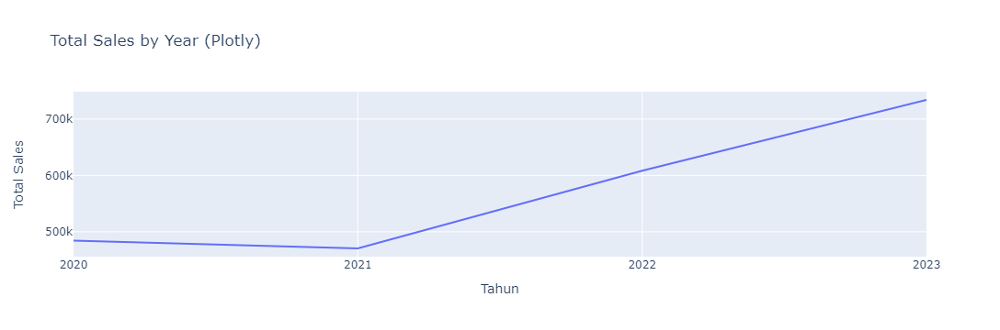

In [41]:
# Plot using Plotly
fig = px.line(dfagg, x='Tahun', y='Total Sales', title='Total Sales by Year (Plotly)')
display(fig) 

Jika kita lihat trend penjualan lisensi secara tahunan dari tahun 2020 - 2023 mengalami trend kenaikkan secara keseluruhan meskipun pada tahun 2020 hingga 2021, mengalami sedikit penurunan (mungkin akibat covid 19), namun tahun setelahnya trend penjualan mengalami kenaikkan secara konsisten selama 2 tahun berturut - turut 

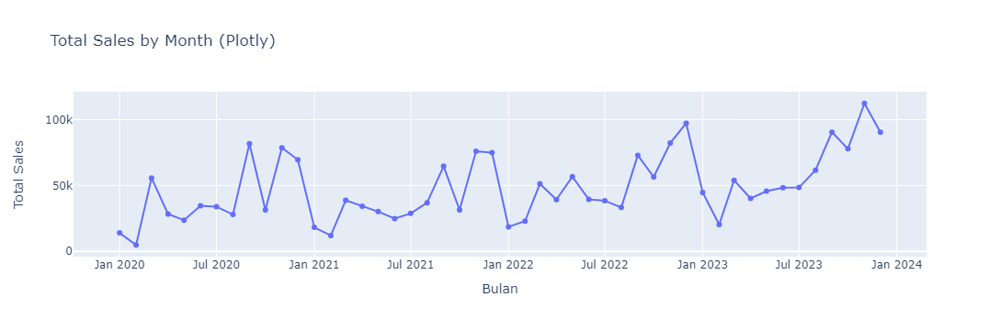

In [45]:
# Plot using Plotly
fig = px.line(dfmon, x='Bulan', y='Total Sales', markers=True, title='Total Sales by Month (Plotly)')
display(fig) 

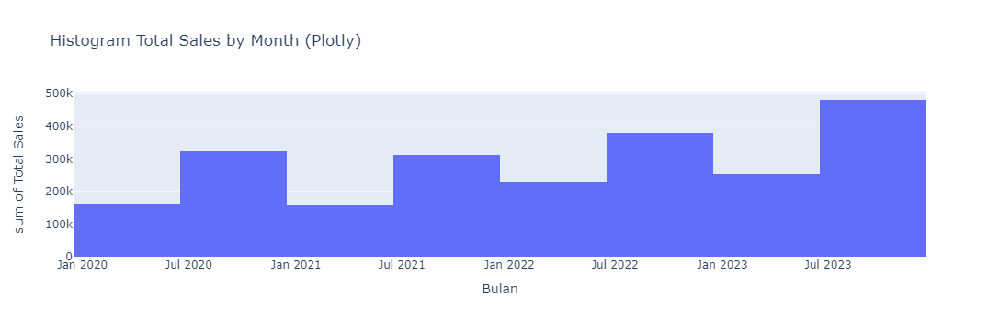

In [72]:
# Plot using Plotly
fig = px.histogram(dfmon, x='Bulan', y='Total Sales', title='Histogram Total Sales by Month (Plotly)')
display(fig) 

Jika kita lihat trend penjualan lisensi secara bulanan juga mengalami kenaikkan secara konsisten di tiap tahunnya. Kemudian, berdasarkan grafik histogram, ditemukan bahwa pada semester 2 di tiap tahun, penjualan cenderung mengalami kenaikkan signifikan jika dibandingkan pada semester 1 pada tahun yang sama. 

# Berdasarkan Industri

In [23]:
# Berdasarkan Industri 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Tahun'] = df2['Order Date'].dt.year.astype(str)
dfbar = df2.groupby(["Tahun", "Industry"])["Sales"].sum().reset_index()
dfbar = dfbar.rename(columns={"Sales":"Total Sales"})
dfbar.head()

,Tahun,Industry,Total Sales
0,2020,Communications,21573.1470
1,2020,Consumer Products,40893.1000
2,2020,Energy,57817.4026
3,2020,Finance,83243.0902
4,2020,Healthcare,76901.8420


In [75]:
# Berdasarkan Industri 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Bulan'] = df2['Order Date'].dt.to_period("M").astype(str)
dfbar2 = df2.groupby(["Bulan", "Industry"])["Sales"].sum().reset_index()
dfbar2 = dfbar2.rename(columns={"Sales":"Total Sales"})
dfbar2.head()

,Bulan,Industry,Total Sales
0,2020-01,Consumer Products,87.158
1,2020-01,Energy,4889.218
2,2020-01,Finance,1297.624
3,2020-01,Healthcare,66.094
4,2020-01,Manufacturing,1978.432


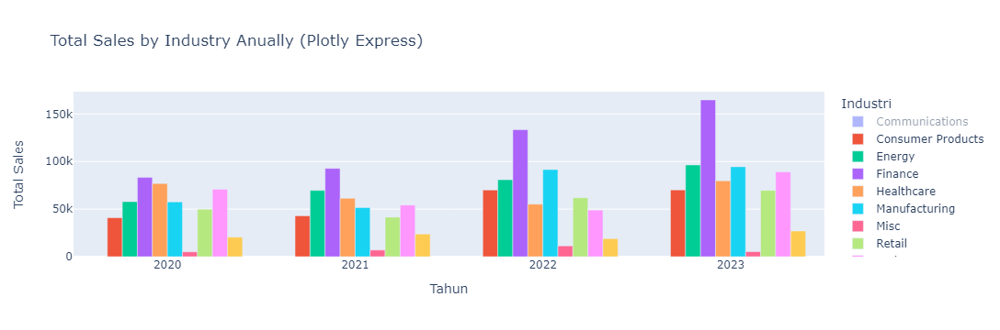

In [28]:
# Create a bar chart using Plotly Express
fig = px.bar(dfbar, x='Tahun', y='Total Sales', color='Industry',
             labels={'Total Sales': 'Total Sales', 'Industry': 'Industri'},
             title='Total Sales by Industry Anually (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()


Jika kita lihat trend penjualan lisensi secara tahunan dari tahun 2020 - 2023 mengalami trend kenaikkan secara konsisten untuk hampir semua industri :
* Finance
* Energy 
* HealthCare
* Manufacturing
* Consumer Products
* Retail
* Tech
* Transportation

Dari industri - industri di atas, kita dapat melihat bahwa industri Finance mengalami kenaikkan yang paling signifikan di setiap tahunnya.

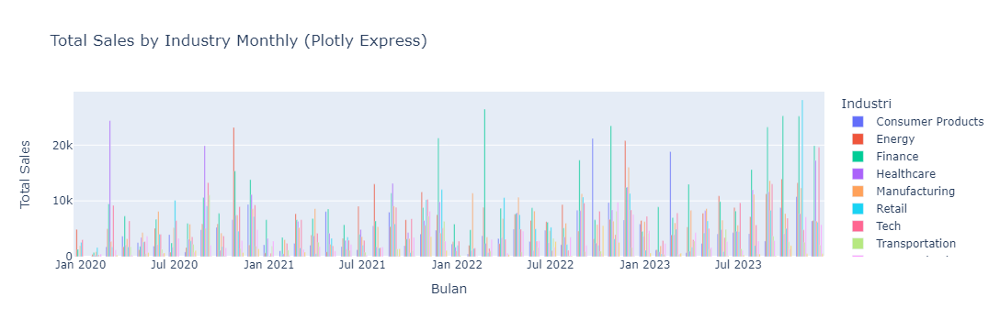

In [33]:
# Create a bar chart using Plotly Express
fig = px.bar(dfbar2, x='Bulan', y='Total Sales', color='Industry',
             labels={'Total Sales': 'Total Sales', 'Industry': 'Industri'},
             title='Total Sales by Industry Monthly (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

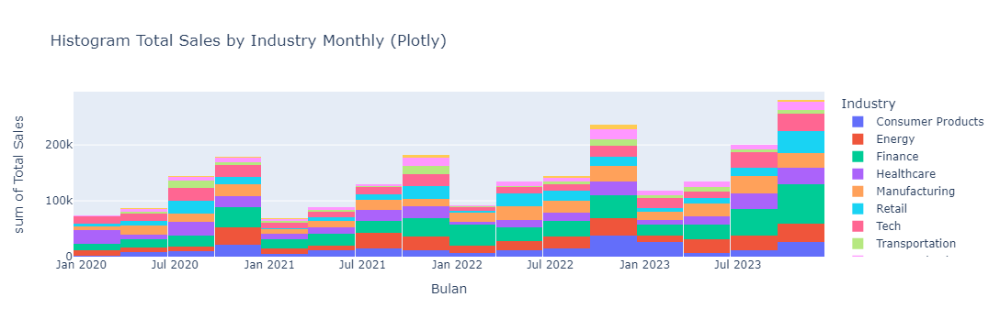

In [77]:
# Plot using Plotly
fig = px.histogram(dfbar2, x='Bulan', y='Total Sales', color='Industry', title='Histogram Total Sales by Industry Monthly (Plotly)')
display(fig) 

Jika kita lihat trend penjualan lisensi secara tahunan dari tahun 2020 - 2023 mengalami trend kenaikkan secara konsisten di setiap bulannya untuk hampir semua industri :
* Finance
* Energy 
* HealthCare
* Manufacturing
* Consumer Products
* Retail
* Tech
* Transportation

Selain itu terlihat bahwa di setiap kuartal terjadl peningkatan yang signifikan dibandingkan dengan kuartal sebelumnya. Dari industri - industri di atas, kita dapat melihat bahwa industri Finance mengalami kenaikkan yang paling signifikan di setiap tahunnya.

# Berdasarkan Segment

In [30]:
# Berdasarkan Segment 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Tahun'] = df2['Order Date'].dt.year.astype(str)
dfseg = df2.groupby(["Tahun", "Segment"])["Sales"].sum().reset_index()
dfseg = dfseg.rename(columns={"Sales":"Total Sales"})
dfseg

,Tahun,Segment,Total Sales
0,2020,Enterprise,89715.8118
1,2020,SMB,266096.8126
2,2020,Strategic,128434.8737
3,2021,Enterprise,75239.2688
4,2021,SMB,266535.9333
5,2021,Strategic,128757.3069
6,2022,Enterprise,105235.3370
7,2022,SMB,296295.5392
8,2022,Strategic,206942.9538
9,2023,Enterprise,159462.7309


In [9]:
# Berdasarkan Segment 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Bulan'] = df2['Order Date'].dt.to_period("M").astype(str)
dfseg2 = df2.groupby(["Bulan", "Segment"])["Sales"].sum().reset_index()
dfseg2 = dfseg2.rename(columns={"Sales":"Total Sales"})
dfseg2.head()

,Bulan,Segment,Total Sales
0,2020-01,Enterprise,5607.550
1,2020-01,SMB,6637.151
2,2020-01,Strategic,1701.528
3,2020-02,Enterprise,168.370
4,2020-02,SMB,3458.520


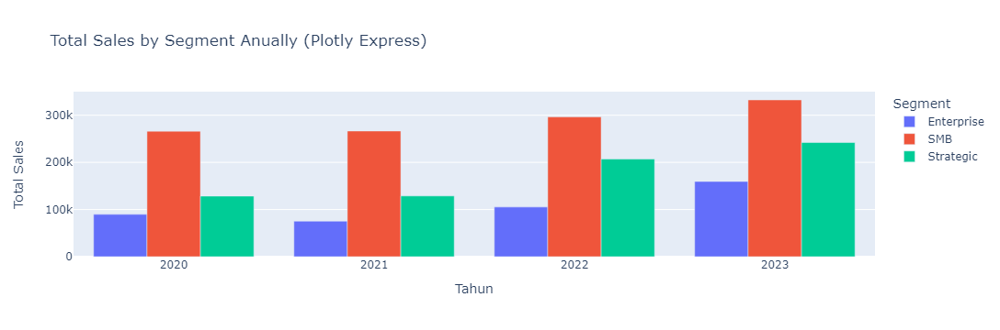

In [35]:
# Create a bar chart using Plotly Express
fig = px.bar(dfseg, x='Tahun', y='Total Sales', color='Segment',
             labels={'Total Sales': 'Total Sales', 'Segment': 'Segment'},
             title='Total Sales by Segment Anually (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

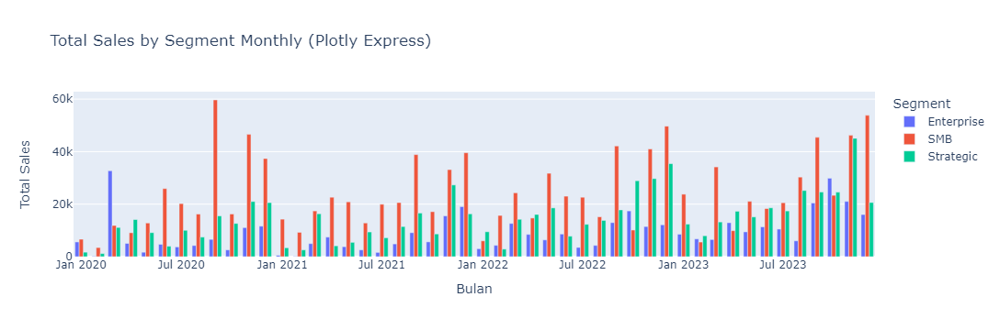

In [37]:
# Create a bar chart using Plotly Express
fig = px.bar(dfseg2, x='Bulan', y='Total Sales', color='Segment',
             labels={'Total Sales': 'Total Sales', 'Segment': 'Segment'},
             title='Total Sales by Segment Monthly (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

Jika kita lihat trend penjualan lisensi secara tahunan dari tahun 2020 - 2023 mengalami trend kenaikkan secara konsisten untuk semua segment. Dari grafik diatas, kita dapat melihat bahwa secara proporsi, SMB menempati industri dengan proporsi terbesar sedangkan untuk pertumbuhan sales paling signifikan terletak pada segment Strategic.

# Berdasarkan Negara

In [11]:
# Berdasarkan Negara 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Tahun'] = df2['Order Date'].dt.year.astype(str)
dfcnt = df2.groupby(["Tahun", "Country", "Region"])["Sales"].sum().reset_index()
dfcnt = dfcnt.rename(columns={"Sales":"Total Sales"})
dfcnt.head()

,Tahun,Country,Region,Total Sales
0,2020,Argentina,AMER,4192.280
1,2020,Australia,APJ,16202.707
2,2020,Belgium,EMEA,4807.783
3,2020,Brazil,AMER,6172.251
4,2020,Canada,AMER,29871.576


In [12]:
# Berdasarkan Negara 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Bulan'] = df2['Order Date'].dt.to_period("M").astype(str)
dfcnt2 = df2.groupby(["Bulan", "Country", "Region"])["Sales"].sum().reset_index()
dfcnt2 = dfcnt2.rename(columns={"Sales":"Total Sales"})
dfcnt2.head()

,Bulan,Country,Region,Total Sales
0,2020-01,Australia,APJ,288.060
1,2020-01,Belgium,EMEA,64.864
2,2020-01,Brazil,AMER,949.116
3,2020-01,Chile,AMER,378.594
4,2020-01,Colombia,AMER,545.940


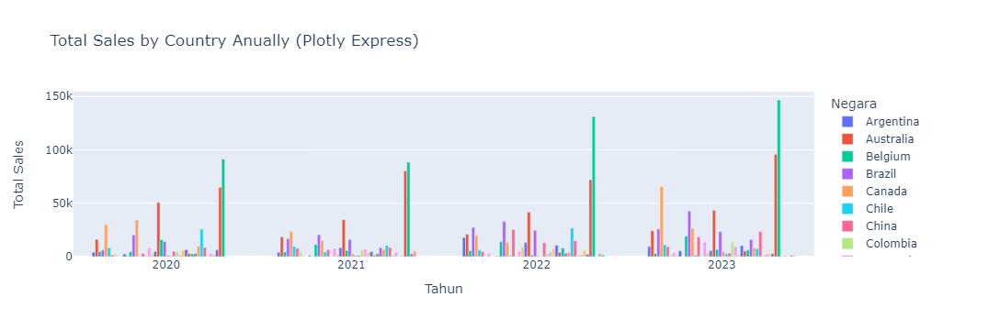

In [13]:
# Create a bar chart using Plotly Express
fig = px.bar(dfcnt, x='Tahun', y='Total Sales', color='Country',
             labels={'Total Sales': 'Total Sales', 'Country': 'Negara'},
             title='Total Sales by Country Anually (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

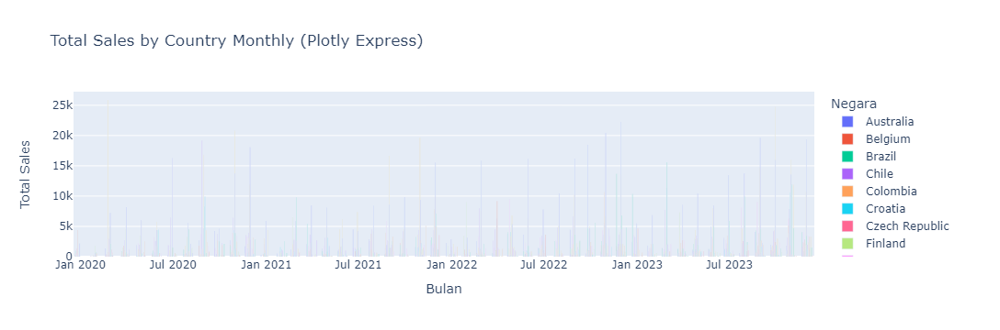

In [80]:
# Create a bar chart using Plotly Express
fig = px.bar(dfcnt2, x='Bulan', y='Total Sales', color='Country',
             labels={'Total Sales': 'Total Sales', 'Country': 'Negara'},
             title='Total Sales by Country Monthly (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

Dari grafik diatas, kita dapat melihat bahwa secara proporsi, Sales tertinggi didapatkan pada penjualan di negara United States dengan proporsi paling besar dibanding negara lainnya dan bertumbuh paling signifikan di tiap tahunnya. Kemudian disusul oleh United Kingdom, Japan, dan France.

Dapat disimpulkan top 5 negara yang menyumbang proporsi penjualan paling banyak dengan market yang masih bertumbuh, adalah :
* United States
* United Kingdom
* Japan
* France
* Brazil

# Berdasarkan Product

In [15]:
# Berdasarkan Segment 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Tahun'] = df2['Order Date'].dt.year.astype(str)
dfreg = df2.groupby(["Tahun", "Product"])["Sales"].sum().reset_index()
dfreg = dfreg.rename(columns={"Sales":"Total Sales"})
dfreg.head()

,Tahun,Product,Total Sales
0,2020,Alchemy,10849.7820
1,2020,Big Ol Database,62023.3730
2,2020,ChatBot Plugin,6057.9820
3,2020,ContactMatcher,89576.6305
4,2020,Data Smasher,25014.2720


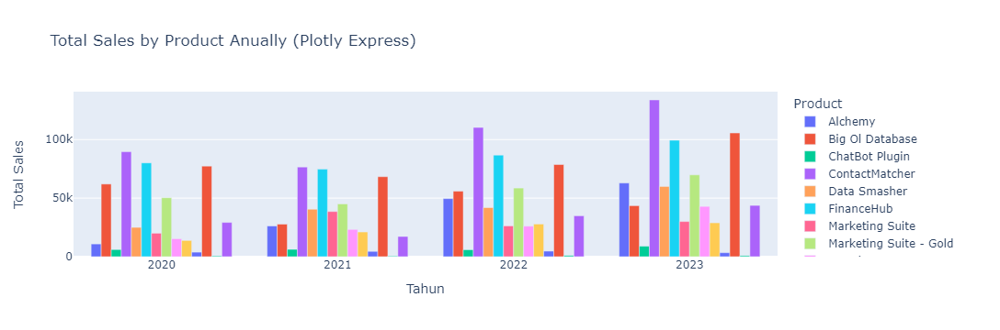

In [16]:
# Create a bar chart using Plotly Express
fig = px.bar(dfreg, x='Tahun', y='Total Sales', color='Product',
             labels={'Total Sales': 'Total Sales', 'Product': 'Product'},
             title='Total Sales by Product Anually (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

Dari grafik diatas, kita dapat melihat bahwa secara proporsi, Sales tertinggi didapatkan pada penjualan produk Site Analytics, disusul oleh FinanceHub.
    
Dapat disimpulkan top 5 produk yang menyumbang proporsi pertumbuhan penjualan paling banyak, adalah :
* ContactMatcher
* Site Analytics
* Finance Hub
* Marketing Suite - Gold
* Alchemy

Perlu diperhatikan juga dari grafik diatas kita juga bisa melihat penjualan produk dengan tren yang menurun secara periodik, antara lain :
* Big Ol Database
* SaaS Connector Pack - Gold

# Berdasarkan Region

In [42]:
# Berdasarkan Segment 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Tahun'] = df2['Order Date'].dt.year.astype(str)
dfreg = df2.groupby(["Tahun", "Region"])["Sales"].sum().reset_index()
dfreg = dfreg.rename(columns={"Sales":"Total Sales"})
dfreg

,Tahun,Region,Total Sales
0,2020,AMER,156450.6030
1,2020,APJ,91284.4476
2,2020,EMEA,236512.4475
3,2021,AMER,163271.5235
4,2021,APJ,86004.5350
5,2021,EMEA,221256.4505
6,2022,AMER,230846.2875
7,2022,APJ,109524.6140
8,2022,EMEA,268102.9285
9,2023,AMER,287281.1905


In [18]:
# Berdasarkan Segment 
df2 = df1.copy()
df2["Order Date"] = pd.to_datetime(df2["Order Date"])
df2['Bulan'] = df2['Order Date'].dt.to_period("M").astype(str)
dfreg2 = df2.groupby(["Bulan", "Region"])["Sales"].sum().reset_index()
dfreg2 = dfreg2.rename(columns={"Sales":"Total Sales"})
dfreg2.head()

,Bulan,Region,Total Sales
0,2020-01,AMER,4079.015
1,2020-01,APJ,448.090
2,2020-01,EMEA,9419.124
3,2020-02,AMER,1413.206
4,2020-02,APJ,229.004


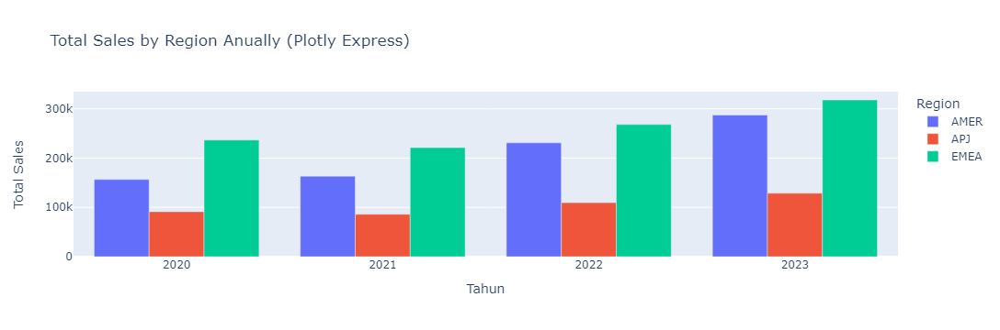

In [44]:
# Create a bar chart using Plotly Express
fig = px.bar(dfreg, x='Tahun', y='Total Sales', color='Region',
             labels={'Total Sales': 'Total Sales', 'Region': 'Region'},
             title='Total Sales by Region Anually (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

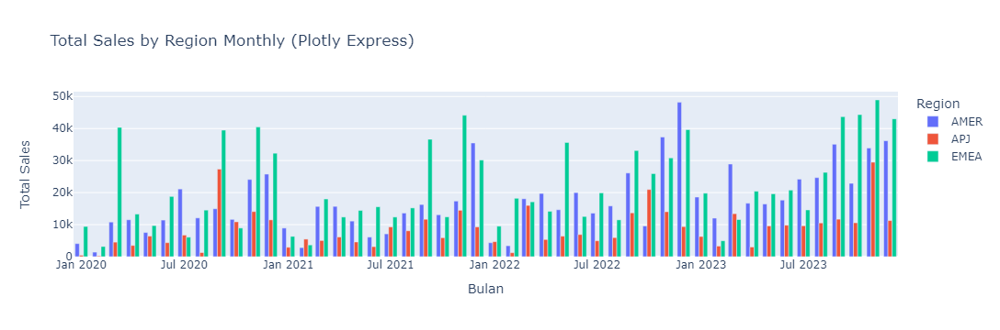

In [46]:
# Create a bar chart using Plotly Express
fig = px.bar(dfreg2, x='Bulan', y='Total Sales', color='Region',
             labels={'Total Sales': 'Total Sales', 'Region': 'Region'},
             title='Total Sales by Region Monthly (Plotly Express)',
             barmode='group')
# Show the plot
fig.show()

Jika kita lihat trend penjualan lisensi secara tahunan dari tahun 2020 - 2023 mengalami trend kenaikkan secara konsisten untuk semua region. Dari grafik diatas, kita dapat melihat bahwa secara proporsi, EMEA menempati region dengan proporsi terbesar dengan pertumbuhan sales yang signifikan dari waktu ke waktu.

# Menganalisa Pemberian Diskon terhadap Quantity Penjualan

In [14]:
dfdisc = df1.copy()
dfdisc = dfdisc.groupby(["Discount"]).agg({
    'Quantity': ['sum','mean'],  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Profit': 'mean',
    'Product': 'nunique'
}).reset_index()
dfdisc["Sales"] = dfdisc["Sales"].astype(int)
dfdisc = dfdisc.rename(columns={"Quantity":"Qty Pembelian", "Sales" : "Total Sales"})
dfdisc

Discount Qty Pembelian           Total Sales      Profit Product
                      sum      mean         sum        mean nunique
0       0.0         18267  3.807211     1087908   66.900292      14
1      10.0           373  3.968085       54369   96.055074       3
2      15.0           198  3.807692       27558   27.288298       1
3      20.0         13660  3.735302      764594   24.702572      14
4      30.0           849  3.740088      103226  -45.679636       4
5      32.0           105  3.888889       14493  -88.560656       1
6      40.0           786  3.815534      116417 -111.927429       4
7      45.0            45  4.090909        5484 -226.646464       1
8      50.0           241  3.651515       58918 -310.703456       3
9      60.0           501  3.630435        6644  -43.077212       1
10     70.0          1660  3.971292       40620  -95.874060       3
11     80.0          1188  3.960000       16963 -101.796797       2

Dari tabel diatas, kita bisa melihat bahwa pemberian diskon berdampak pada rata - rata profit yang diperoleh pada penjualan lisensi. Terlihat bahwa semakin besar diskon yang diberikan rata - rata profit akan menjadi lebih kecil, hakan ketika discount berada di atas 20 persen, profit yang dihasilkan bernilai negatif. 

Berikutnya untuk memastikan apabila pemberian diskon berpengaruh terhadap jummlah kuantitas penjualan, mari kita cek terlebih dahulu produk apa saja yang diberikan diskon dan jenis diskon apa saja yang telah diberikan terhadap produk tersebut.

In [130]:
dfdisc2 = df1[df1['Discount'] > 0]
dfdisc2.groupby(["Product"]).agg({
    'Discount':  ['nunique', 'min', 'max']
})

Discount           
                            nunique   min  max
Product                                       
Alchemy                           2  0.20  0.4
Big Ol Database                   6  0.10  0.7
ChatBot Plugin                    1  0.20  0.2
ContactMatcher                    7  0.20  0.8
Data Smasher                      1  0.20  0.2
FinanceHub                        3  0.10  0.3
Marketing Suite                   6  0.15  0.7
Marketing Suite - Gold            1  0.20  0.2
OneView                           3  0.10  0.8
SaaS Connector Pack               2  0.20  0.6
SaaS Connector Pack - Gold        1  0.20  0.2
Site Analytics                    2  0.20  0.4
Storage                           1  0.20  0.2
Support                           1  0.20  0.2

Dari tabel diatas, kita bisa melihat produk - produk yang paling sering diberikan diskon adalah :
* ContactMatcher
* Big Ol Database
* Marketing Suite

Jika kita lihat dari grafik bar chart sebelumnya, ContactMatcher  merupakan produk dengan penjualan tertinggi dan memiliki pertumbuhan penjualan yang meningkat dari tahun ke tahun. Oleh karena itu, mari kita ambil sample dari produk pada tabel di atas untuk dilakukan pengecekkan lebih lanjut keterkaitan pemberian diskon terhadap kuantitas penjualan.

In [10]:
#Sampling 1 produk
for i in ["Big Ol Database", "Alchemy", "ContactMatcher", "Marketing Suite", "FinanceHub"] :
    dfs = df1[df1["Product"] == i]
    dfs = dfs.groupby(["Discount"]).agg({
        'Quantity': ['sum','mean'],  # You can use 'mean', 'max', 'min', etc.
        'Sales': 'sum',
        'Profit': 'mean',
        'Customer': 'nunique'
    }).reset_index()
    dfs["Sales"] = dfs["Sales"].astype(int)
    dfs = dfs.rename(columns={"Quantity":"Qty Pembelian " + i, "Sales" : "Total Sales"})
    display(dfs)

Discount Qty Pembelian Big Ol Database           Total Sales      Profit  \
                                     sum      mean         sum        mean   
0      0.0                           138  4.758621       71034  935.786976   
1      0.1                             5  2.500000        3410  416.042150   
2      0.2                           117  3.774194       37954  160.329110   
3      0.3                            12  2.400000        3756   65.207900   
4      0.4                            47  3.615385       19546 -205.141800   
5      0.5                            32  2.666667       37935 -636.269092   
6      0.7                            89  3.869565       15601 -851.274743   

  Customer  
   nunique  
0       25  
1        2  
2       24  
3        4  
4       11  
5       11  
6       18

Discount Qty Pembelian Alchemy           Total Sales       Profit Customer
                             sum      mean         sum         mean  nunique
0      0.0                    82  3.727273       76449  1616.187950       20
1      0.2                   119  3.216216       56159   483.208508       29
2      0.4                    33  3.666667       16919   242.552800        9

Discount Qty Pembelian ContactMatcher           Total Sales      Profit  \
                                    sum      mean         sum        mean   
0     0.00                         1601  3.914425      153408  128.583742   
1     0.20                         2508  3.894410      130872   45.208464   
2     0.30                          180  3.333333       25182  -63.006067   
3     0.40                          292  3.893333       45614 -215.831957   
4     0.45                           45  4.090909        5484 -226.646464   
5     0.50                          133  3.694444       13675 -239.316314   
6     0.70                         1503  3.955263       22559  -43.687101   
7     0.80                          953  4.090129       13581  -94.031751   

  Customer  
   nunique  
0       93  
1       97  
2       38  
3       50  
4        9  
5       32  
6       94  
7       85

Discount Qty Pembelian Marketing Suite           Total Sales      Profit  \
                                     sum      mean         sum        mean   
0     0.00                           211  3.516667       31935  101.261862   
1     0.15                           198  3.807692       27558   27.288298   
2     0.20                           167  3.630435       26841    2.837004   
3     0.30                            43  4.300000        4282  -55.587260   
4     0.32                           105  3.888889       14493  -88.560656   
5     0.50                            76  4.222222        7308 -236.433983   
6     0.70                            68  4.533333        2459 -259.662627   

  Customer  
   nunique  
0       48  
1       39  
2       37  
3        7  
4       22  
5       18  
6       15

Discount Qty Pembelian FinanceHub           Total Sales     Profit Customer
                                sum      mean         sum       mean  nunique
0      0.0                     1485  3.991935      100300  70.847291       94
1      0.1                      313  4.118421       46634  93.565946       56
2      0.2                     1344  3.584000      123995  14.419555       92
3      0.3                      614  3.886076       70005 -42.639979       74

In [102]:
# Compute correlation Discount vs Quantity
correlation = dfdisc['Discount'].corr(dfdisc['Total Qty Pembelian'])
print(f'Correlation Disc vs Quantity {correlation}')
if (correlation < 0.5):
    print("Menolak H0, tidak ada korelasi yang kuat antara discount dengan qty pembelian")
else:
    print("Menerima H0, terdapat korelasi yang kuat antara discount dengan qty pembelian")

Correlation Disc vs Quantity -0.06293706293706294
Menolak H0, tidak ada korelasi yang kuat antara discount dengan qty pembelian


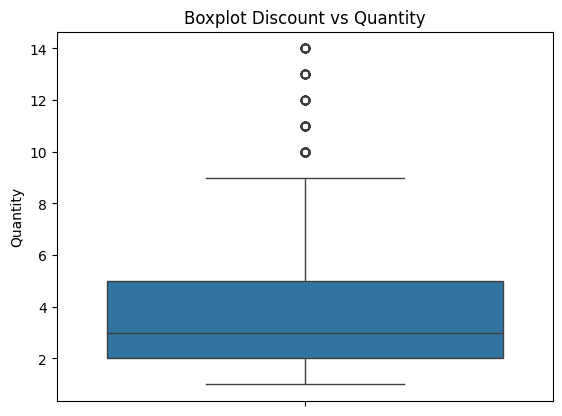

In [52]:
sns.boxplot(y='Quantity', data=df1)
plt.title('Boxplot Discount vs Quantity')
plt.show()

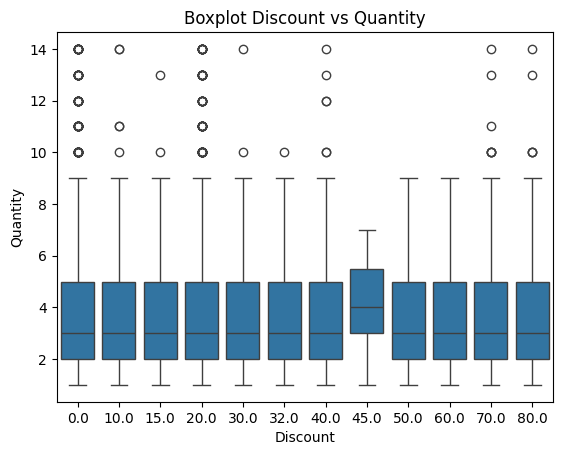

In [51]:
sns.boxplot(y='Quantity', x='Discount', data=df1)
plt.title('Boxplot Discount vs Quantity')
plt.show()

Berdasarkan hasil uji korelasi yang kurang dari 0.5 dan juga kita melihat dari sebaran box plot bahwa sebarannya tidak normal sehingga dapat disimpulkan bahwa tidak ada keterkaitan antara pemberian diskon terhadap kuantitas penjualan lisensi.

# Breakdown Berdasarkan Country

Berikutnya mari kita breakdown terkait behavior penjualan per country secara keseluruhan.

In [11]:
dfins = df1.copy()
dfins = dfins.groupby(["Country"]).agg({
    'Quantity': 'mean',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Customer':'nunique',
    'Product':'nunique',
    'Profit': 'sum'
})
dfins = dfins.rename(columns={"Quantity":"Avg Qty Pembelian", "Sales" : "Sales", "Customer": "Jml Customer"})
dfins.sort_values(by='Profit', ascending=False, inplace=True)
dfins.reset_index()

,Country,Avg Qty Pembelian,Sales,Jml Customer,Product,Profit
0,United States,3.831584,457687.6315,99,14,76381.3871
1,United Kingdom,3.740578,313169.8810,99,14,74989.0891
2,Canada,3.721344,138641.2700,86,14,33402.6517
3,Brazil,3.709804,76269.6140,68,14,24463.1876
4,Spain,3.986607,70636.7200,61,14,18597.9504
5,India,3.879195,53555.3600,46,13,18382.9363
6,Finland,3.831522,49095.8400,54,14,16250.0433
7,Luxembourg,3.719101,29863.1500,34,12,10823.1874
8,Ireland,3.801587,34298.1400,43,13,10249.1561
9,Philippines,3.822917,27451.0690,34,14,9977.3748


# Breakdown Berdasarkan Customer

Berikutnya mari kita breakdown terkait behavior penjualan per country secara keseluruhan.

In [33]:
dfins = df1.copy()
dfins = dfins.groupby(["Customer"]).agg({
    'Region':'nunique',
    'Subregion':'nunique',
    'Country':'nunique',
    'City':'nunique',
    'Segment':'nunique',
    'Industry':'nunique',
    'License':'nunique',
    'Quantity': 'sum',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Product':'nunique',
    'Profit': 'sum'
})
dfins = dfins.rename(columns={"Quantity":"Total Qty Pembelian", "Sales" : "Total Sales", "License" : "Jml License", "City" : "Jml City"})
dfins.sort_values(by='Jml License', ascending=False, inplace=True)
display(dfins)

,Region,Subregion,Country,Jml City,Segment,Industry,Jml License,Total Qty Pembelian,Total Sales,Product,Profit
Customer,,,,,,,,,,,
Allianz,3,12,24,54,2,1,192,709,42904.1670,13,5531.8834
Tyson Foods,3,11,26,51,2,1,184,747,40326.3440,13,1690.5775
Ford Motor,3,11,26,52,3,1,176,672,43893.0424,14,4010.7662
Siemens,3,12,28,47,3,1,170,639,36008.3686,13,6519.5105
Comcast,3,10,25,49,3,1,161,564,25597.5700,13,2086.9055
...,...,...,...,...,...,...,...,...,...,...,...
Tesco,3,9,12,19,3,1,48,158,8173.2260,11,1689.7108
Alphabet,3,8,12,17,2,1,44,181,16116.4610,11,3980.3457
Berkshire Hathaway,3,10,14,21,2,1,39,119,7100.9290,11,812.7311


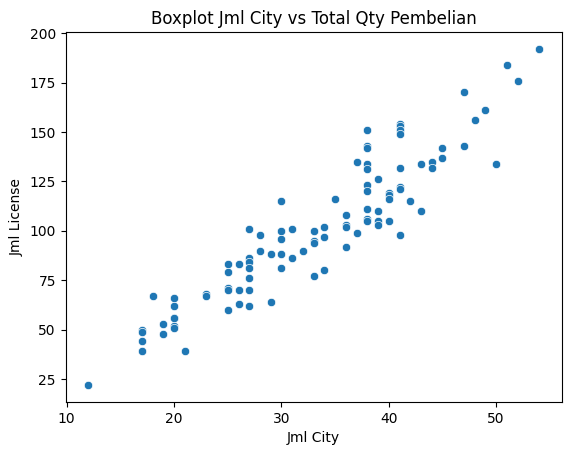

In [34]:
sns.scatterplot(x='Jml City', y='Jml License', data=dfins)
plt.title('Boxplot Jml City vs Total Qty Pembelian')
plt.show()

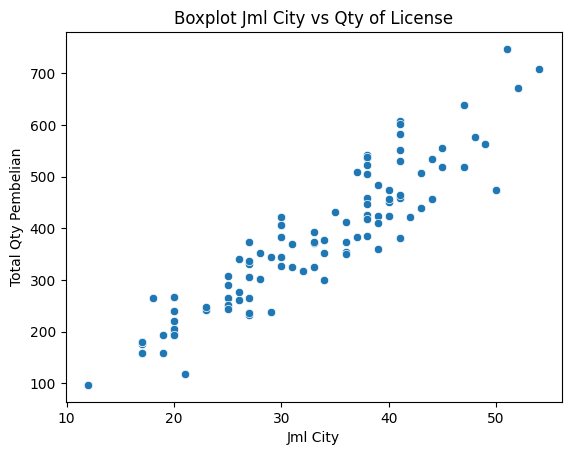

In [32]:
sns.scatterplot(x='Jml City', y='Total Sales', data=dfins)
plt.title('Boxplot Jml City vs Total Sales')
plt.show()

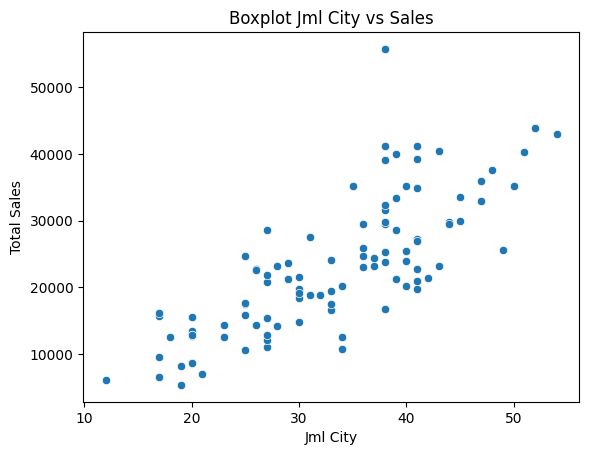

In [36]:
sns.scatterplot(x='Jml City', y='Total Sales', data=dfins)
plt.title('Boxplot Jml City vs Sales')
plt.show()

Dapat dilihat bahwa, dalam 1 customer memiliki banyak cabang yang tersebar di seluruh dunia. Berdasarkan total penjualan, Anthem menyumbang nilai penjualan lisensi paling banyak. Apabila dilihat dari segi profit, Valero Energy menyumbang profit paling banyak. 

Selain itu, berdasarkan tabel ini kita juga dapat melihat bahwa jumlah pembelian lisensi meningkat seiring meningkatnya jumlah kota yang dirambah oleh masing - masing customer dan sejalan dengan meningkatnya jumlah total pembelian. Meskipun total pembelian meningkat, namun belum berarti peningkatan tersebut juga sejalan dengan tingkat kenaikkan profit dan salesnya karena beberapa faktor lainnya seperti harga produk dan profit mempengaruhi metriks ini.

# Breakdown Berdasarkan Industry

Berikutnya mari kita breakdown terkait behavior penjualan per industri secara keseluruhan.

In [36]:
dfins = df1.copy()
dfins = dfins.groupby(["Customer"]).agg({
    'Quantity': 'mean',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Customer':'nunique',
    'Product':'nunique'
})
dfins = dfins.rename(columns={"Quantity":"Avg Qty Pembelian", "Sales" : "Sales", "Customer": "Jml Customer"})
dfins.sort_values(by='Sales', ascending=False, inplace=True)
dfins.reset_index()

,Customer,Avg Qty Pembelian,Sales,Jml Customer,Product
0,Anthem,3.902985,55719.2100,1,13
1,Ford Motor,3.818182,43893.0424,1,14
2,Allianz,3.692708,42904.1670,1,13
3,Bank of America Corp.,4.015152,41255.9471,1,13
4,Valero Energy,3.980952,41220.4188,1,12
...,...,...,...,...,...
94,Tesco,3.291667,8173.2260,1,11
95,Berkshire Hathaway,3.051282,7100.9290,1,11
96,Safeway,4.051282,6633.1370,1,12
97,Citigroup,4.409091,6132.5210,1,10


In [35]:
dfins = df1.copy()
dfins = dfins.groupby(["Industry"]).agg({
    'Quantity': 'mean',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Customer':'nunique',
    'Product':'nunique'
})
dfins = dfins.rename(columns={"Quantity":"Avg Qty Pembelian", "Sales" : "Sales", "Customer": "Jml Customer"})
dfins.sort_values(by='Sales', ascending=False, inplace=True)
dfins.reset_index()

,Industry,Avg Qty Pembelian,Sales,Jml Customer,Product
0,Finance,3.764457,474150.4844,20,14
1,Energy,3.738602,304644.1409,14,14
2,Manufacturing,3.752864,295192.3812,11,14
3,Healthcare,3.834128,273183.2882,10,14
4,Tech,3.896440,263169.0277,13,14
5,Consumer Products,3.790402,224044.1422,9,14
6,Retail,3.799383,223072.0720,11,14
7,Communications,3.657673,120962.2365,5,13
8,Transportation,3.923077,90191.3276,4,14
9,Misc,3.859813,28591.7596,2,14


Dapat dilihat bahwa rata - rata per tiap customer di dalam industri melakukan pembelian sekitar 3 - 4 lisensi software. Dapat dilihat juga dengan behavior pembelian customer diantara 3 - 4 lisensi maka terlihat semakin meningkatnya jumlah customer pada industri tersebut, maka semakin meningkat pula kuantitas penjualannya yang berdampak pada meningkatnya total penjualan. Selain itu terlihat pula bahwa per tiap industri rata - rata 14 jenis produk, hanya industri komunikasi saja yang hanya melakukan pembelian 13 jenis produk.

# Breakdown Berdasarkan Segment

In [92]:
dfins = df1.copy()
dfins = dfins.groupby(["Segment"]).agg({
    'Quantity': 'sum',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Customer':'nunique',
    'Product':'nunique',
    'Industry':'nunique',
    'Profit':'mean'
})
dfins['Sales'] = dfins['Sales'].astype(int)
dfins = dfins.rename(columns={"Quantity":"Total Pembelian", "Sales" : "Total Sales", "Customer" : "Jumlah Customer"})
dfins.sort_values(by='Total Sales', ascending=False, inplace=True)
dfins.reset_index()

,Segment,Total Pembelian,Total Sales,Jumlah Customer,Product,Industry,Profit
0,SMB,19521,1161401,96,14,10,25.836873
1,Strategic,11608,706146,91,14,10,30.456667
2,Enterprise,6744,429653,76,14,10,33.818664


Dapat dilihat bahwa rata - rata per tiap customer di dalam industri melakukan pembelian sekitar 3 - 4 lisensi software. Dapat dilihat juga dengan behavior pembelian customer diantara 3 - 4 lisensi maka terlihat semakin meningkatnya jumlah customer pada industri tersebut, maka semakin meningkat pula kuantitas penjualannya yang berdampak pada meningkatnya total penjualan. Selain itu terlihat pula bahwa per tiap industri rata - rata 14 jenis produk, hanya industri komunikasi saja yang hanya melakukan pembelian 13 jenis produk.

# Breakdown Berdasarkan Product

In [43]:
dfins = df1[df1["Discount"] <= 0]
dfins = dfins.groupby(["Product"]).agg({
    'Quantity': 'sum',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Industry':'nunique',
    'Customer':'nunique',
    'Segment':'nunique',
    'Region':'nunique',
    'Country':'nunique',
    'Profit':'mean'
})
dfins['Price Per Unit'] = dfins['Sales'] / dfins['Quantity']
dfins = dfins.rename(columns={"Quantity":"Total Qty Pembelian", "Sales" : "Total Sales", "Profit":"Avg Profit"})
dfins.sort_values(by='Total Sales',ascending=False, inplace=True)
dfins.reset_index()

,Product,Total Qty Pembelian,Total Sales,Industry,Customer,Segment,Region,Country,Avg Profit,Price Per Unit
0,Marketing Suite - Gold,2044,157853.76,10,98,3,3,33,48.166361,77.227867
1,ContactMatcher,1601,153408.24,10,93,3,3,34,128.583742,95.820262
2,Site Analytics,1102,123879.71,10,89,3,3,27,110.499065,112.413530
3,Data Smasher,1835,118370.31,10,95,3,3,34,74.924106,64.506981
4,FinanceHub,1485,100300.29,10,94,3,3,33,70.847291,67.542283
5,Support,3629,84717.08,10,98,3,3,36,27.769879,23.344470
6,OneView,1021,78066.19,10,93,3,3,29,85.548842,76.460519
7,Alchemy,82,76449.18,8,20,3,3,14,1616.187950,932.307073
8,Big Ol Database,138,71034.00,10,25,3,3,11,935.786976,514.739130
9,SaaS Connector Pack,2163,61449.80,10,98,3,3,33,29.506075,28.409524


In [40]:
dfins = df1.copy()
dfins = dfins.groupby(["Product"]).agg({
    'Quantity': 'sum',  # You can use 'mean', 'max', 'min', etc.
    'Sales': 'sum',
    'Industry':'nunique',
    'Customer':'nunique',
    'Segment':'nunique',
    'Region':'nunique',
    'Country':'nunique',
    'Profit':'mean'
})
dfins['Price Per Unit'] = dfins['Sales'] / dfins['Quantity']
dfins = dfins.rename(columns={"Quantity":"Total Qty Pembelian", "Sales" : "Total Sales", "Profit":"Avg Profit"})
dfins.sort_values(by='Total Sales',ascending=False, inplace=True)
dfins.reset_index()

,Product,Total Qty Pembelian,Total Sales,Industry,Customer,Segment,Region,Country,Avg Profit,Price Per Unit
0,ContactMatcher,7215,410378.2650,10,99,3,3,46,6.784084,56.878484
1,FinanceHub,3756,340935.4150,10,99,3,3,45,32.758838,90.770877
2,Site Analytics,3289,330007.0540,10,99,3,3,43,50.073938,100.336593
3,Marketing Suite - Gold,3158,223843.6080,10,99,3,3,43,25.152277,70.881446
4,Big Ol Database,440,189238.6310,10,62,3,3,25,29.432669,430.087798
5,Data Smasher,2976,167380.3180,10,97,3,3,44,54.111788,56.243386
6,Alchemy,234,149528.0300,9,49,3,3,22,817.909190,639.008675
7,Support,5825,125152.7440,10,98,3,3,46,21.066968,21.485450
8,Marketing Suite,868,114879.9963,10,89,3,3,33,-15.230509,132.350226
9,OneView,1729,107532.1610,10,97,3,3,40,38.922758,62.193268


Berdasarkan data diatas, kita dapat melihat bahwa `ContactMatcher` merupakan produk yang paling laris dijual. Namun, kalau kita lihat meskipun `ContactMatcher` merupakan produk dengan jumlah penjualan dan total penjualan terbesar, rata - rata profit yang dibuat dari penjualan produk tersebut tidaklah besar. Produk dengan rata - rata profit terbesar adalah `Alchemy` yang notabene menempati urutan ke 4 dari segi pertumbuhan dan merupakan urutan ke 6 produk dengan nilai penjualan terbesar yang dibeli.

Selain itu, dapat dilihat bahwa Alchemy merupakan satu -satunya produk yang hanya terjual ke 9 Industri dengan hanya 49 customer, sehingga masih banyak ruang untuk pertumbuhan penjualan yang lebih besar di masa mendatang.

# Menganalisa Proporsi Kuantitas Penjualan

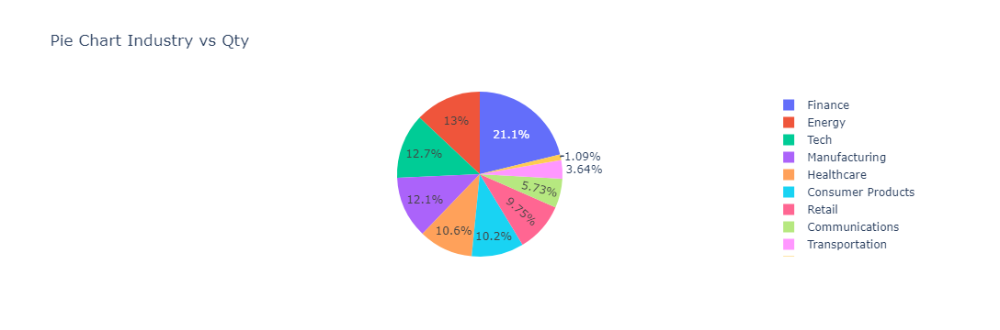

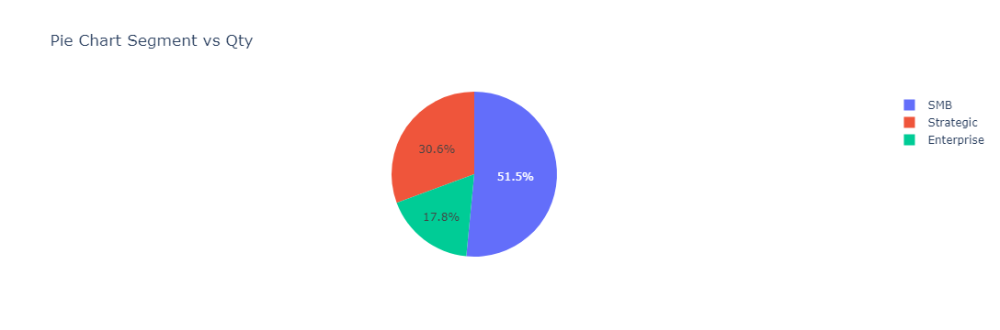

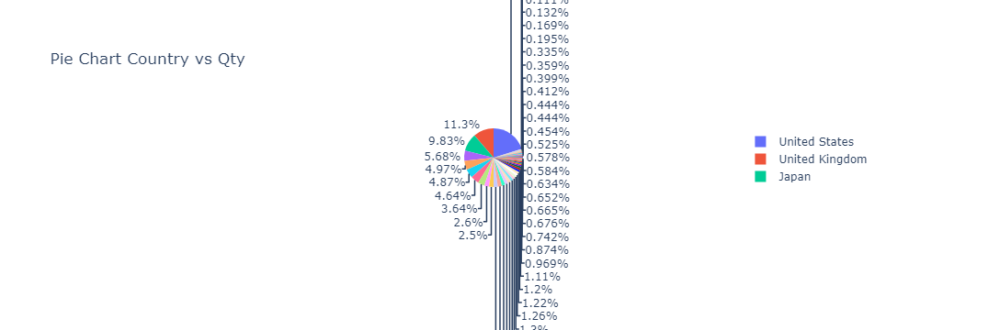

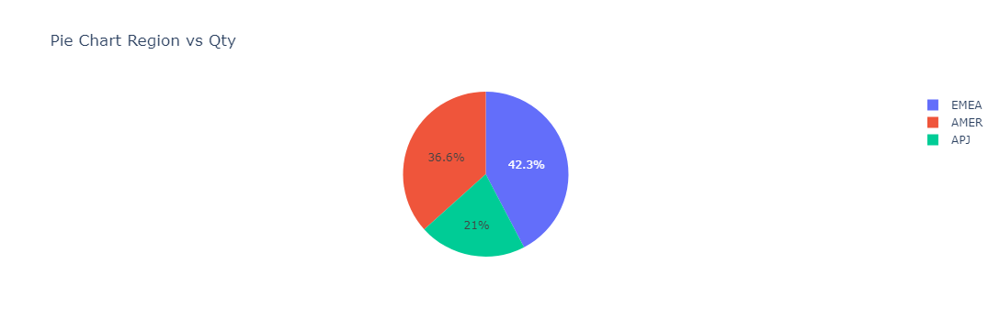

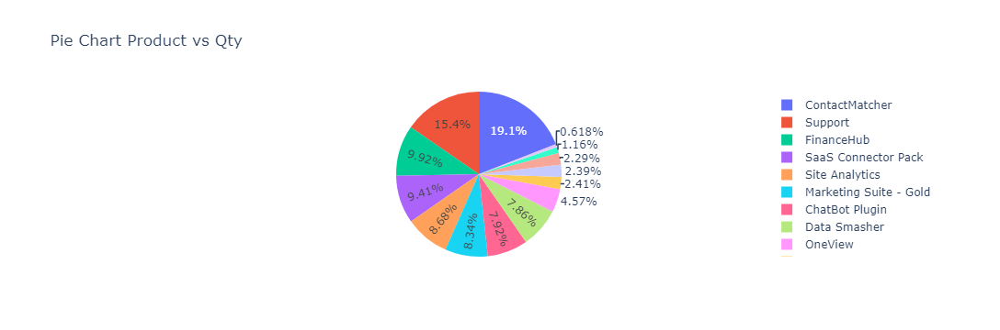

In [42]:
for i in ['Industry', 'Segment', 'Country', 'Region','Product']:
    # Create a pie chart using Plotly
    fig = px.pie(df1, values='Quantity', names=i, title='Pie Chart ' + i + ' vs Qty')
    
    # Show the chart
    fig.show()

Berdasarkan grafik diatas, kita dapat melihat bahwa :
* Finance merupakan industri yang paling banyak melakukan pembelian lisensi software disusul oleh Energy, Tech, dan Manufacturing.
* Dapat dikatakan sebagian besar pembelian (lebih dari 50%), total pembelian software dilakukan oleh bisnis dengan segment SMB (Small Medium Business)
* United states merupakan negara yang peling banyak melakukan pembelian software disusul oleh United Kingdom dan Japan.
* Meskipun negara pada region AMER menempati pembelian terbanyak namun secara region, EMEA merupakan region yang melakukan pembelian lisensi software terbesar secara akumulatif.
* `ContactMatcher` merupakan produk yang terjual paling banyak yang kemudian disusul oleh `Support`,`FinanceHub`, dan `SaaS Connector Pack` 

# Menganalisa Proporsi Profit

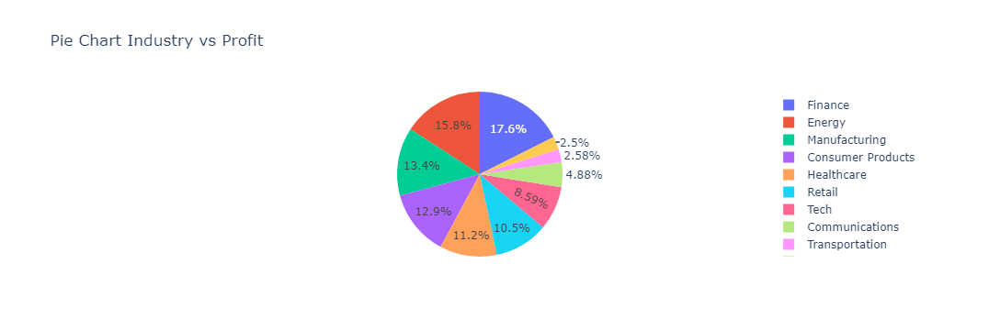

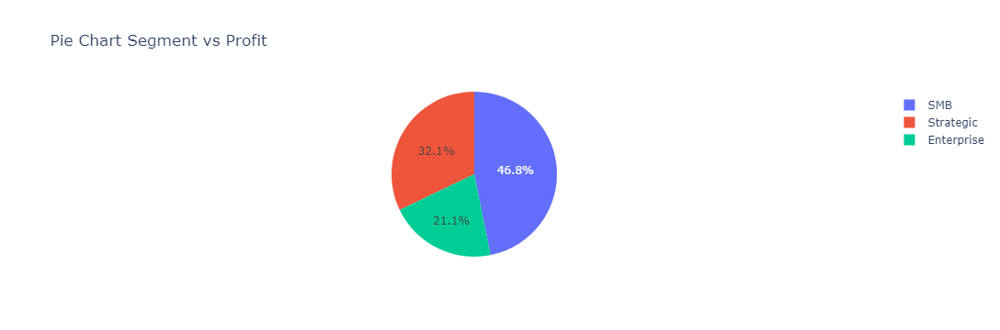

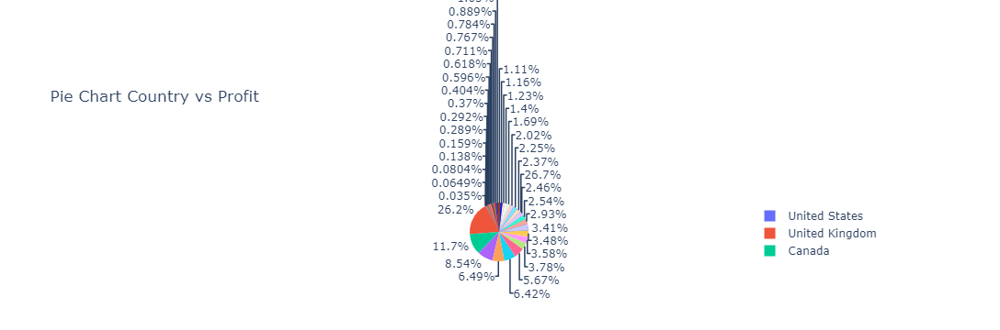

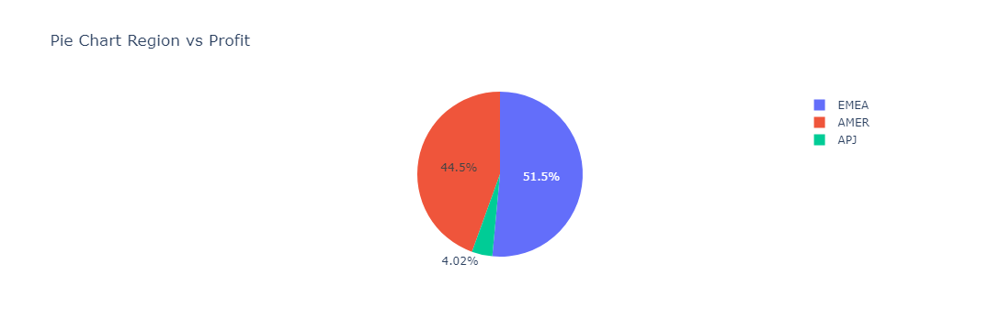

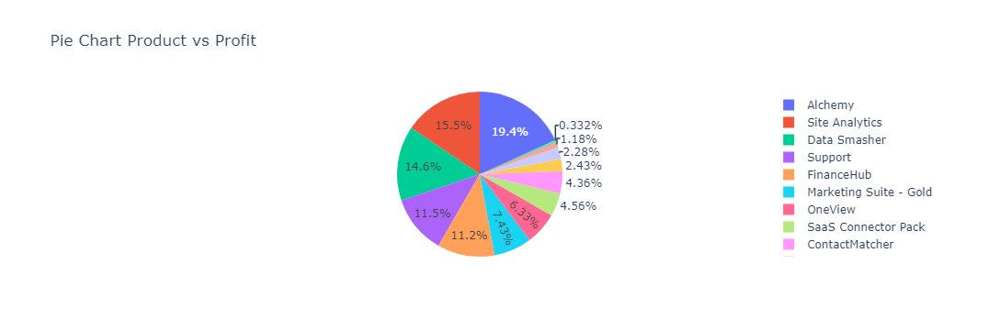

In [8]:
for i in ['Industry', 'Segment', 'Country', 'Region','Product']:
    # Create a pie chart using Plotly
    fig = px.pie(df1, values='Profit', names=i, title='Pie Chart ' + i + ' vs Profit')
    
    # Show the chart
    fig.show()

Berdasarkan grafik diatas, kita dapat melihat bahwa :
* Finance merupakan industri yang paling banyak mendatangkan profit disusul oleh Energy sejalan dengan proporsi pembelian yang dilakukan. Menariknya, untuk posisi ketiga dan keempat ditempati oleh Manufacturing dan Consumer Products yang menandakan bahwa meskipun Tech merupakan salah satu top 4 dengan jumlah pembelian terbanyak namun secara profit justru industri tersebut berada pada posisi ke 6.
* Dapat dikatakan sebagian besar profit didatangkan melalui bisnis dengan segment SMB (Small Medium Business).
* United States merupakan negara yang peling banyak melakukan mendatangkan profit disusul oleh United Kingdom, Canada, Brazil, dan Spain. Hal ini sejalan dengan pada grafik pie proporsi kuantitas penjualan lisensi.
* EMEA merupakan region yang mendatangkan profit dari penjualan lisensi software terbesar secara akumulatif sejalan dengan grafik pie proporsi kuantitas penjualan lisensi.
* `Alchemy` merupakan produk yang mendatangkan profit paling besar yang kemudian disusul oleh `Site Analytics`,`Data Smasher`, dan `Support`.


# Kesimpulan dan Rekomendasi 

Dari analisis yang telah dilakukan, kita bisa membuat kesimpulan dari 9,994 data yang kita miliki.
* Penjualan dilakukan ke 48 negara, 262 kota, dan terhadap 99 customer.
* Jumlah produk yang dijual berdasarkan data adalah 14 produk.
* Penjualan lisensi software secara trend dari awal tahun 2021 ke akhir tahun 2023 mengalami peningkatan secara konsisten.
* Berdasarkan grafik histogram per bulan, penjualan software cenderung mengalami pengingkatan signifikan pada semester 2 pada tahun yang sama.
* Penjualan produk paling banyak didominasi oleh industri `Finance` dan `Energy`.
* Negara United States merupakan negara yang menyumbang jumlah penjualan lisensi paling banyak sedangkan jika diukur berdasarkan margin profit, United Kingdom merupakan negara yang menyumbang profit paling tinggi dikarenakan lisensi software yang terjual di negara tersebut memiliki rata - rata profit yang tinggi.
* Produk `ContactMatcher` merupakan lisensi software yang paling banyak terjual, sedangkan apabila dilihat dari total profit yang telah digenerate, `Alchemy` merupakan lisensi software yang paling banyak menyumbangkan profit.
* Produk `Big Ol Database` dan `SaaS Connector Pack - Gold` merupakan produk dengan trend penjualan menurun dari awal tahun 2021 ke akhir tahun 2023.
* Pemberian diskon terbukti tidak berpengaruh cukup signifikan dalam mendongkrak penjualan lisensi software.
* Beberapa negara seperti Belgium, Germany, Chile, South Africa, Russia, Sweden, Australia, France, Mexico, dan Japan  merupakan negara yang menyumbangkan kerugian yang sebagian besar diakibatkan penjualan dengan diskon yang cukup besar 
* EMEA merupakan region dengan jumlah penjualan lisensi software terbesar yang mendatangkan profit dari penjualan lisensi software terbesar secara akumulatif sejalan dengan grafik pie proporsi kuantitas penjualan lisensi.
* Region APJ merupakan region dengan penjualan lisensi software paling sedikit namun masih bertumbuh dari tahun ke tahun.
* Penjualan lisensi software paling banyak diserap oleh segment SMB, sekaligus segment SMB menyumbang profit paling besar.
* Ketika memberikan diskon diatas 20%, profit yang dihasilkan penjualan tersebut cenderung menjadi negatif atau merugi.
* Dapat dilihat bahwa, dalam 1 customer memiliki banyak cabang yang tersebar di seluruh dunia.
* Berdasarkan total penjualan, Anthem menyumbang nilai penjualan lisensi paling banyak. Apabila dilihat dari segi profit, Valero Energy menyumbang profit paling banyak. 
* Jumlah pembelian lisensi meningkat seiring meningkatnya jumlah kota yang dirambah oleh masing - masing customer dan sejalan dengan meningkatnya jumlah total pembelian. Hal ini menandakan ada hubungan antara jumlah city yang dirambah oleh customer dengan jumlah penjualan lisensi software.
* Produk `ContactMatcher`, `Big Ol Database` dan `Marketing Suite` merupakan produk yang paling sering diberikan diskon.
* Rata - rata tiap customer hanya melakukan pembelian sebanyak 3 sampai 4 lisensi software
* `Storage` merupakan produk dengan penjualan terkecil meskipun harga per unit nya adalah yang paling murah.
* Berdasarkan data dapat disimpulkan pula bahwa sektor Software as a Service (SaaS) ini memiliki price elasticity yang cukup tinggi yang artinya apabila terjadi perubahan harga tidak mempengaruhi penjualan secara signifikan.

**Rekomendasi**
1. Pemberian diskon di atas 20% perlu dipertimbangkan ulang karena dalam berbagai kesempatan hanya menggerus profit secara keseluruhan tanpa memberikan dampak signifikan terhadap penjualan lisensi software.
2. Sektor Software as a Service (SaaS) ini memiliki price elasticity yang cukup tinggi yang artinya apabila terjadi perubahan harga tidak mempengaruhi penjualan secara signifikan sehingga dapat dikatakan pemberian diskon tidak memberikan dampak signifikan. Hal ini dapat dimanfaatkan untuk coba menaikkan harga jual per unit dari produk yang ditawarkan ke customer untuk meningkatkan margin profit penjualan per license.
3. Apabila ingin meningkatkan volume penjualan dapat memfokuskan penjualan pada customer yang merambah jumlah kota yang banyak.
4. Untuk memaksimalkan profit, produk dengan margin profit tinggi seperti `Alchemy` harus mulai digencarkan pada customer yang memiliki jumlah kota yang cukup besar seperti Anthem.
5. Fokus pada penjualan lisensi software yang memiliki trend penjualan yang meningkat seperti `ContactMatcher`, `Site Analytics` serta pada produk dengan margin profit tinggi seperti `Alchemy` yang masih memiliki ruang pertumbuhan yang cukup terbuka.
6. Usahakan untuk lebih meningkatkan penjualan pada awal tahun untuk meningkatkan volume penjualan tahunan.
7. Bila harus memberikan diskon, hindari pemberian diskon diatas 20%.

Diharapkan analisis ini bisa membantu perusahaan untuk lebih meningkatkan volumen penjualan dan memaksimalkan profit yang dapat diperoleh pada setiap transaksinya.